# La Liga Data Analysis

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import time
import seaborn as sns
import numpy as np
from tabulate import tabulate
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from sklearn.cluster import KMeans
from math import pi

In [2]:
start_time = time.time()
df = pd.read_csv('S2122-laliga-players.csv')
print(time.time() - start_time,'seconds')
df.shape

0.12582731246948242 seconds


(1994, 150)

In [3]:
df.head()

,competition,player.url,id,slug,name,nickname,firstname,lastname,gender,date_of_birth,...,unsuccessful_crosses_open_play,unsuccessful_dribbles,unsuccessful_launches,unsuccessful_layoffs,unsuccessful_long_passes,unsuccessful_passes_opposition_half,unsuccessful_passes_own_half,unsuccessful_short_passes,winning_goal,yellow_cards
0,LaLiga Santander,https://www.laliga.com/en-ES/player/aaron,1307,aaron,Aarón Escandell,Aarón,Aarón,Escandell,male,1995-09-27T00:00:00+00:00,...,NaN,NaN,21.0,NaN,55.0,49.0,7.0,1.0,0.0,1.0
1,LaLiga Santander,https://www.laliga.com/en-ES/player/abqar,8715,abqar,Abdelkabir Abqar,Abqar,Abdelkabir,Abqar,male,1999-03-10T00:00:00+00:00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LaLiga Santander,https://www.laliga.com/en-ES/player/abdessamad...,13770,abdessamad-ezzalzouli,Abdessamad Ezzalzouli,Abde,Abdessamad,Ezzalzouli,male,2001-12-17T00:00:00+00:00,...,13.0,25.0,NaN,NaN,NaN,45.0,8.0,40.0,0.0,4.0
3,LaLiga Santander,https://www.laliga.com/en-ES/player/abdon,200,abdon,Abdón Prats,Abdon,Abdón,Prats,male,1992-12-07T00:00:00+00:00,...,2.0,4.0,1.0,4.0,2.0,41.0,11.0,48.0,1.0,4.0
4,LaLiga Santander,https://www.laliga.com/en-ES/player/adama,536,adama,Adama Traoré,Adama,Adama,Traoré,male,1996-01-25T00:00:00+00:00,...,27.0,11.0,1.0,NaN,1.0,40.0,6.0,18.0,0.0,NaN


In [4]:
df.isnull().head()

,competition,player.url,id,slug,name,nickname,firstname,lastname,gender,date_of_birth,...,unsuccessful_crosses_open_play,unsuccessful_dribbles,unsuccessful_launches,unsuccessful_layoffs,unsuccessful_long_passes,unsuccessful_passes_opposition_half,unsuccessful_passes_own_half,unsuccessful_short_passes,winning_goal,yellow_cards
0,False,False,False,False,False,False,False,False,False,False,...,True,True,False,True,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,True,True,True,True,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,True,True,True,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,True


<AxesSubplot:>

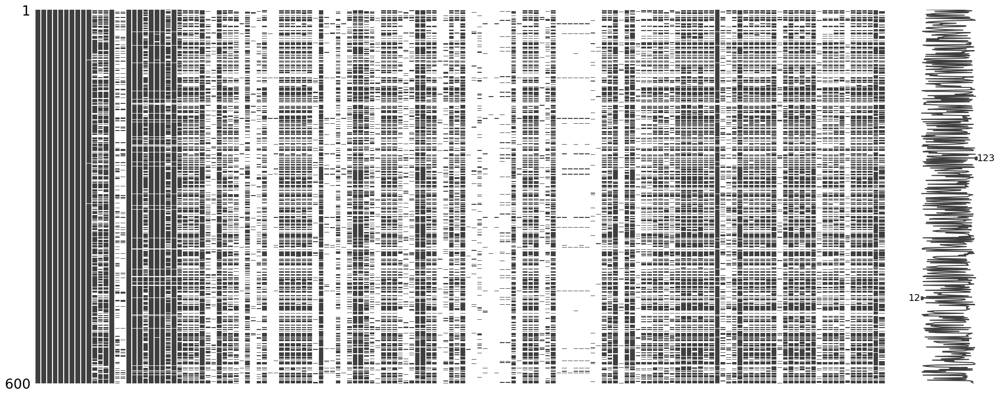

In [5]:
msno.matrix(df.sample(600))

In [6]:
# Set pandas display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [7]:
df.isnull().sum()

competition                                          0
player.url                                           0
id                                                   0
slug                                                 0
name                                                 0
nickname                                             0
firstname                                            0
lastname                                             0
gender                                               0
date_of_birth                                        9
place_of_birth                                     453
weight                                             676
height                                             498
international                                        0
twitter                                           1518
instagram                                         1664
country                                              2
team                                               107
team.short

In [8]:
df.fillna(0, inplace=True)

<AxesSubplot:>

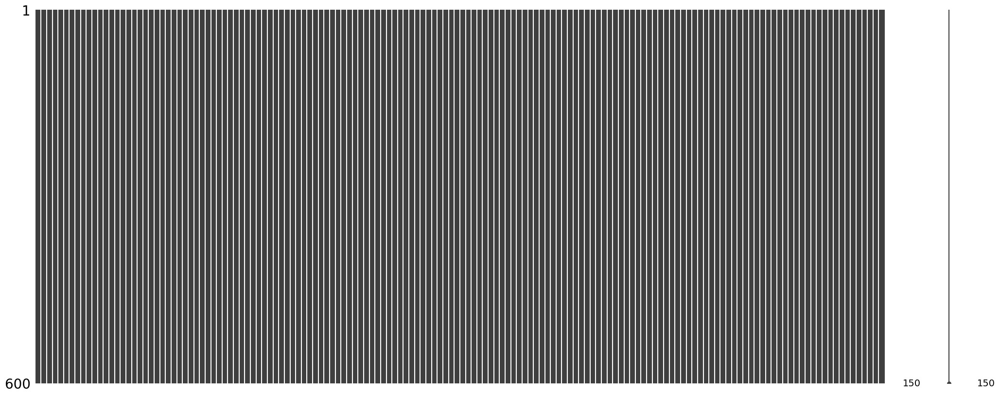

In [9]:
msno.matrix(df.sample(600))

In [10]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Columns: 150 entries, competition to yellow_cards
dtypes: bool(1), float64(127), int64(1), object(21)
memory usage: 2.3+ MB
None


In [11]:
print(df.describe())

                 id       weight       height  shirt_number  aerial_duels  \
count   1994.000000  1994.000000  1994.000000   1994.000000   1994.000000   
mean   10670.718154    47.555165   133.878134     16.999498     28.487462   
std     8323.243519    34.772708    77.602611     11.685866     45.434161   
min        3.000000     0.000000     0.000000      0.000000      0.000000   
25%     2932.500000     0.000000   151.000000      7.000000      0.000000   
50%     8815.500000    67.000000   175.000000     16.000000      6.000000   
75%    16142.250000    75.000000   183.000000     25.000000     43.000000   
max    26966.000000    95.000000   199.000000     57.000000    421.000000   

       aerial_duels_lost  aerial_duels_won  appearances  assists_intentional  \
count        1994.000000       1994.000000  1994.000000          1994.000000   
mean           14.254263         14.233200    16.686058             0.653460   
std            22.052463         24.758184    13.100359           

Duplicate rows are eliminated from a Pandas DataFrame using the drop_duplicates() technique.

In [12]:
df.drop_duplicates(inplace=True)

The column names that need to be deleted from the dataframe df are listed in the code as unwanted_cols, a list of columns. 
The columns parameter of the drop function is then used to delete the columns mentioned in the list from the dataframe.
The modifications are made to the original dataframe df using the inplace=True argument. 
Finally, the display function is used to present the cleaned dataframe.

In [13]:
# List of columns to be removed
unwanted_cols = ['player.url', 'nickname', 'place_of_birth', 'international', 'twitter', 'instagram',
                 'team.shortname', 'team.foundation', 'team.shield', 'photo', 'stadium', 'stadium.image']

# Drop the unwanted columns
df.drop(columns=unwanted_cols, inplace=True)

# Display the cleaned dataset
display(df)

,competition,id,slug,name,firstname,lastname,gender,date_of_birth,weight,height,country,team,shirt_number,position,aerial_duels,aerial_duels_lost,aerial_duels_won,appearances,assists_intentional,attempts_from_set_pieces,away_goals,backward_passes,blocked_shots,blocks,catches,clean_sheets,clearances_off_the_line,corners_taken_incl_short_corners,corners_won,crosses_not_claimed,drops,duels,duels_lost,duels_won,fifty_fifty,forward_passes,foul_attempted_tackle,foul_won_penalty,games_played,gk_successful_distribution,gk_unsuccessful_distribution,goal_assists,goalkeeper_smother,goals,goals_conceded,goals_conceded_inside_box,goals_conceded_outside_box,goals_from_inside_box,goals_from_outside_box,ground_duels,ground_duels_lost,ground_duels_won,handballs_conceded,headed_goals,hit_woodwork,home_goals,index,interceptions,key_passes_attempt_assists,last_man_tackle,left_foot_goals,leftside_passes,offsides,open_play_passes,other_goals,own_goal_scored,penalties_conceded,penalties_faced,penalties_off_target,penalties_saved,penalties_taken,penalty_goals,penalty_goals_conceded,punches,putthrough_blocked_distribution,putthrough_blocked_distribution_won,recoveries,red_cards_2nd_yellow,right_foot_goals,rightside_passes,saves_from_penalty,saves_made,saves_made_caught,saves_made_from_inside_box,saves_made_from_outside_box,saves_made_parried,second_goal_assists,set_pieces_goals,shots_off_target_inc_woodwork,shots_on_target_inc_goals,starts,straight_red_cards,substitute_off,substitute_on,successful_corners_into_box,successful_crosses_corners,successful_crosses_open_play,successful_dribbles,successful_fifty_fifty,successful_launches,successful_layoffs,successful_long_passes,successful_open_play_passes,successful_passes_opposition_half,successful_passes_own_half,successful_short_passes,tackles_lost,tackles_won,team_games_played,through_balls,throw_ins_to_opposition_player,throw_ins_to_own_player,time_played,times_tackled,total_clearances,total_fouls_conceded,total_fouls_won,total_losses_of_possession,total_passes,total_red_cards,total_shots,total_successful_passes_excl_crosses_corners,total_tackles,total_touches_in_opposition_box,total_unsuccessful_passes_excl_crosses_corners,touches,unsuccessful_corners_into_box,unsuccessful_crosses_corners,unsuccessful_crosses_open_play,unsuccessful_dribbles,unsuccessful_launches,unsuccessful_layoffs,unsuccessful_long_passes,unsuccessful_passes_opposition_half,unsuccessful_passes_own_half,unsuccessful_short_passes,winning_goal,yellow_cards
0,LaLiga Santander,1307,aaron,Aarón Escandell,Aarón,Escandell,male,1995-09-27T00:00:00+00:00,71.0,185.0,ES,Granada CF,13.0,Goalkeeper,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,1.0,99.0,0.0,0.0,4.0,34.0,16.0,0.0,0.0,0.0,6.0,6.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,6.0,0.0,45.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,38.0,0.0,0.0,10.0,0.0,10.0,1.0,5.0,5.0,1.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,38.0,21.0,27.0,32.0,21.0,0.0,0.0,38.0,0.0,0.0,0.0,283.0,0.0,5.0,0.0,1.0,56.0,115.0,1.0,0.0,59.0,0.0,0.0,56.0,148.0,0.0,0.0,0.0,0.0,21.0,0.0,55.0,49.0,7.0,1.0,0.0,1.0
1,LaLiga Santander,8715,abqar,Abdelkabir Abqar,Abdelkabir,Abqar,male,1999-03-10T00:00:00+00:00,80.0,188.0,MA,Deportivo Alavés,26.0,Defender,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,LaLiga Santander,13770,abdessamad-ezzalzouli,Abdessamad Ezzalzouli,Abdessamad,Ezzalzouli,male,2001-12-17T00:00:00+00:00,0.0,0.0,MA,FC Barcelona,33.0,Forward,10.0,7.0,3.0,10.0,0.0,0.0,1.0,70.0,6.0,0.0,0.0,0.0,0.0,1

In [14]:
df.dtypes

competition                                        object
id                                                  int64
slug                                               object
name                                               object
firstname                                          object
lastname                                           object
gender                                             object
date_of_birth                                      object
weight                                            float64
height                                            float64
country                                            object
team                                               object
shirt_number                                      float64
position                                           object
aerial_duels                                      float64
aerial_duels_lost                                 float64
aerial_duels_won                                  float64
appearances   

In [15]:
df['team'].nunique()

59

In [16]:
df['team'].value_counts()

0                                 107
FC Barcelona                       71
Levante UD                         67
Real Sociedad                      63
Sevilla FC                         62
Deportivo Alavés                   61
Villarreal CF                      60
SD Eibar                           59
Athletic Club                      58
Rayo Vallecano                     52
CD Leganés                         43
Málaga CF                          43
R. Sociedad B                      40
SD Huesca                          40
Real Sporting                      39
Valencia CF                        38
CF Fuenlabrada                     37
UD Las Palmas                      36
Real Valladolid CF                 36
RCD Espanyol de Barcelona          36
RCD Mallorca                       36
UD Almería                         35
Girona FC                          35
Real Madrid                        35
Madrid CFF                         35
AD Alcorcón                        34
CD Tenerife 

The top 10 players in the dataframe 'df' with the most appearances are shown by a horizontal bar chart created by this code.

The player names are used to first group the dataframe, after which the 'appearances' column is totalled for each player using the'sum()' method. The'sort_values()' method is used to sort the values in ascending order. To choose just the top 10 players with the most appearances, use the 'head(10)' approach.

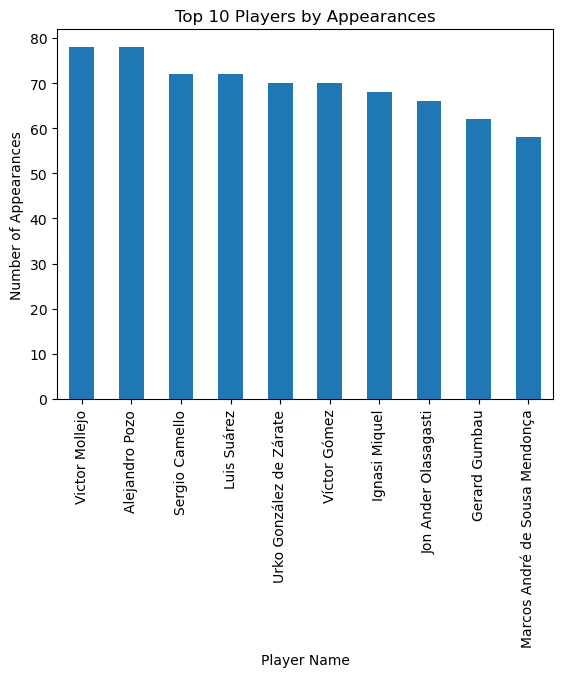

In [17]:
# Create a bar chart of the number of appearances for each player
df.groupby('name')['appearances'].sum().sort_values(ascending=False).head(10).plot(kind='bar')

# Set the title and axis labels
plt.title('Top 10 Players by Appearances')
plt.xlabel('Player Name')
plt.ylabel('Number of Appearances')

# Show the plot
plt.show()

This code creates a bar chart of the top 5 players with the most goals in a season from a given dataset df. The code first groups the data by player name and sums up their goals. Then, it sorts the grouped data in descending order based on the number of goals scored and selects only the top 5 players. The plt.bar() function is used to create the bar chart with player names on the x-axis and the number of goals on the y-axis. The plt.title(), plt.xlabel(), and plt.ylabel() functions are used to set the chart title and axis labels. Finally, the chart is displayed using the plt.show() function.

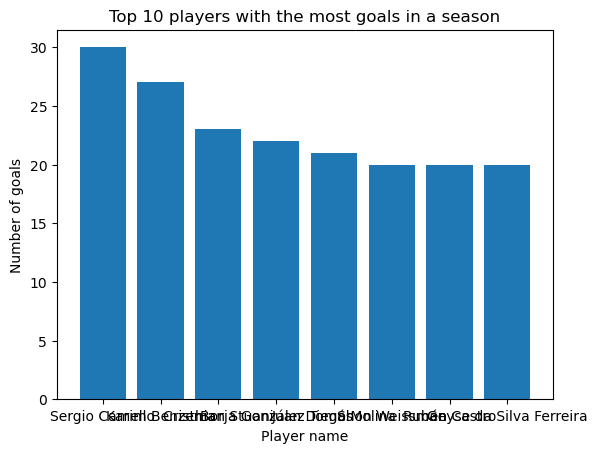

In [18]:
# Group the data by player and sum their goals
grouped = df.groupby('name')['goals'].sum()

# Sort the grouped data by goals in descending order
grouped = grouped.sort_values(ascending=False)[:8]

# Create the bar chart
plt.bar(grouped.index, grouped)

# Set the chart title and axis labels
plt.title('Top 10 players with the most goals in a season')
plt.xlabel('Player name')
plt.ylabel('Number of goals')

# Show the chart
plt.show()

This code analyzes a soccer team dataset by grouping the data by team and calculating the sum of goals and intentional assists. It then sorts the data based on total goals and creates a bar chart to visualize the results.

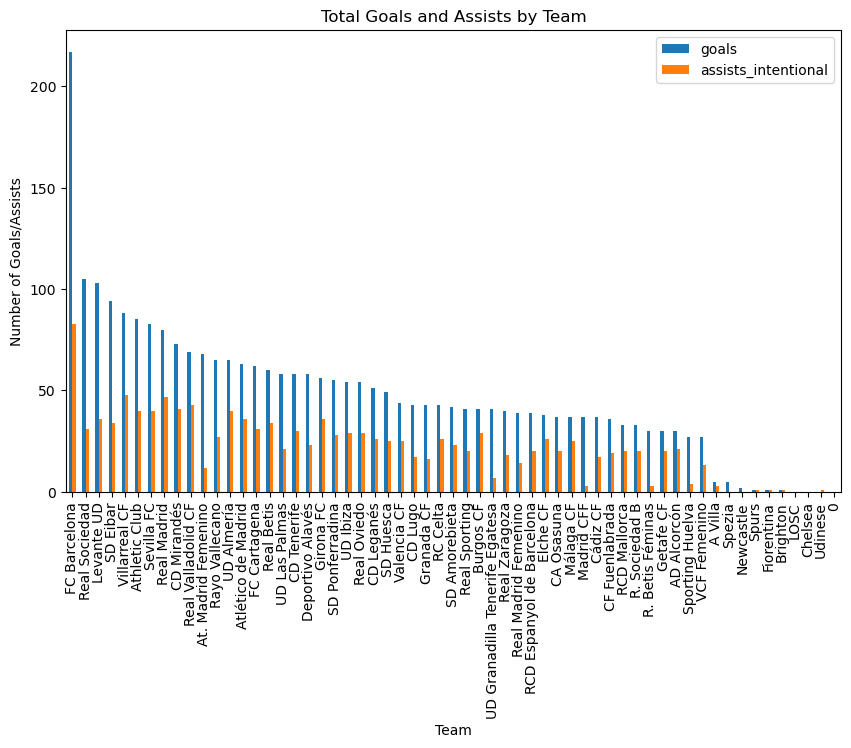

In [19]:
# Group the data by team and sum the goals and assists
team_data = df.groupby('team').agg({'goals': 'sum', 'assists_intentional': 'sum'})

# Sort the data by goals in descending order
team_data = team_data.sort_values(by='goals', ascending=False)

# Create the bar chart
team_data.plot(kind='bar', y=['goals', 'assists_intentional'], figsize=(10,6))
plt.title('Total Goals and Assists by Team')
plt.xlabel('Team')
plt.ylabel('Number of Goals/Assists')
plt.show()

# Hypothesis 1: Players who take more shots on target are more likely to score goals.

Null Hypothesis (H0): There is no significant relationship between the number of shots on target and the number of goals scored by a player. Alternative Hypothesis (HA): There is a significant relationship between the number of shots on target and the number of goals scored by a player.

 

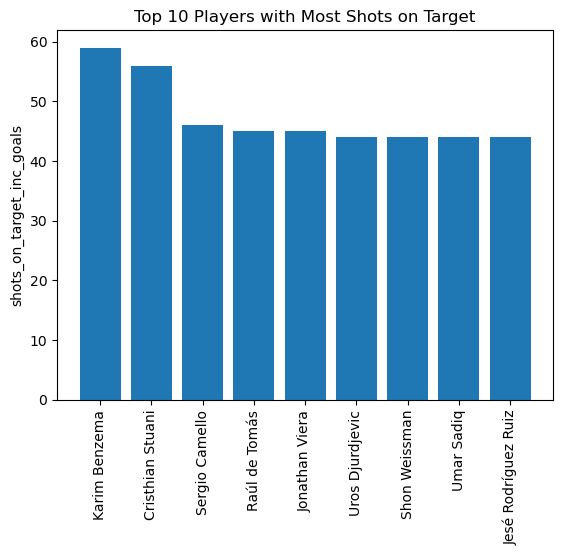

In [20]:
shots_on_target = df.sort_values(by='shots_on_target_inc_goals', ascending=False)[:10]

plt.bar(shots_on_target['firstname'] + ' ' + shots_on_target['lastname'], shots_on_target['shots_on_target_inc_goals'])
plt.xticks(rotation=90)
plt.ylabel('shots_on_target_inc_goals')
plt.title('Top 10 Players with Most Shots on Target')
plt.show()

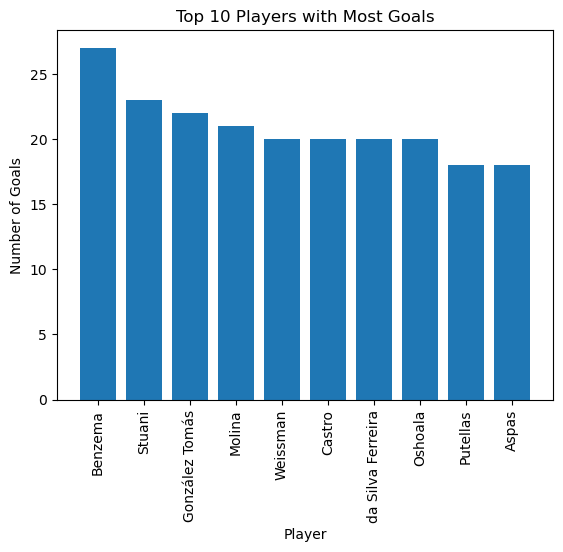

In [21]:
# sort the data by goals in descending order
df = df.sort_values('goals', ascending=False).reset_index(drop=True)

# select top 10 players with most goals
top_10 = df.head(10)

# create a bar chart
plt.bar(top_10['lastname'], top_10['goals'])
plt.title('Top 10 Players with Most Goals')
plt.xlabel('Player')
plt.ylabel('Number of Goals')
plt.xticks(rotation=90)
plt.show()

In [22]:
# Define the dependent and independent variables
y = df['goals']
X = df['shots_on_target_inc_goals']

# Add constant to independent variable
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary statistics
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  goals   R-squared:                       0.730
Model:                            OLS   Adj. R-squared:                  0.729
Method:                 Least Squares   F-statistic:                     5375.
Date:                Tue, 25 Apr 2023   Prob (F-statistic):               0.00
Time:                        00:52:59   Log-Likelihood:                -3645.0
No. Observations:                1994   AIC:                             7294.
Df Residuals:                    1992   BIC:                             7305.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

The sns.lmplot function generates a scatterplot with a linear regression line, with the y-axis representing the total number of goals scored and the x-axis representing the total number of shots on target (including goals). The linear regression line depicts the direction and degree of the link between the two variables, and the plot enables us to visually evaluate this relationship. The plot's context is established by the title and axis labels.

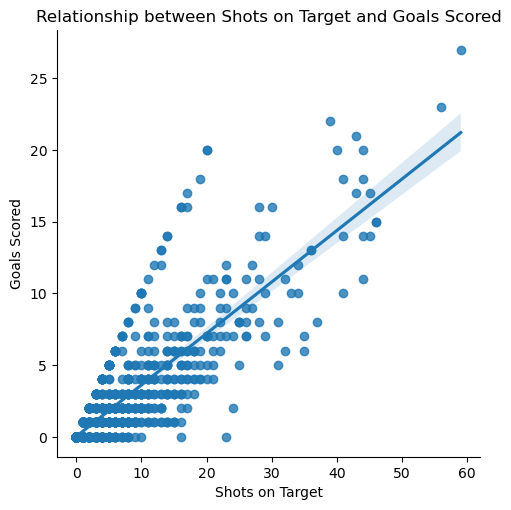

In [23]:
sns.lmplot(x='shots_on_target_inc_goals', y='goals', data=df)
plt.xlabel('Shots on Target')
plt.ylabel('Goals Scored')
plt.title('Relationship between Shots on Target and Goals Scored')
plt.show()

# Hypothesis 2: Players who make more successful passes in the opposition half have a higher number of key passes.

Null Hypothesis (H0): There is no significant relationship between the number of successful passes in the opposition half and the number of key passes made by a player.

Alternative Hypothesis (HA): There is a significant relationship between the number of successful passes in the opposition half and the number of key passes made by a player.

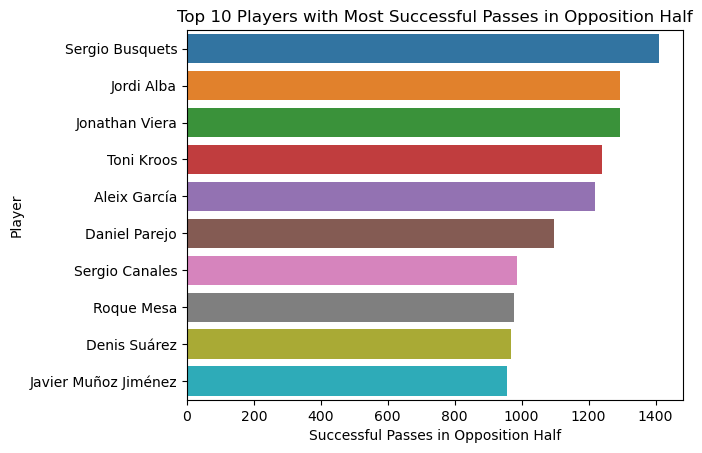

In [24]:
top_10 = df.sort_values(by='successful_passes_opposition_half', ascending=False)[:10]
sns.barplot(x='successful_passes_opposition_half', y='name', data=top_10)
plt.xlabel('Successful Passes in Opposition Half')
plt.ylabel('Player')
plt.title('Top 10 Players with Most Successful Passes in Opposition Half')
plt.show()

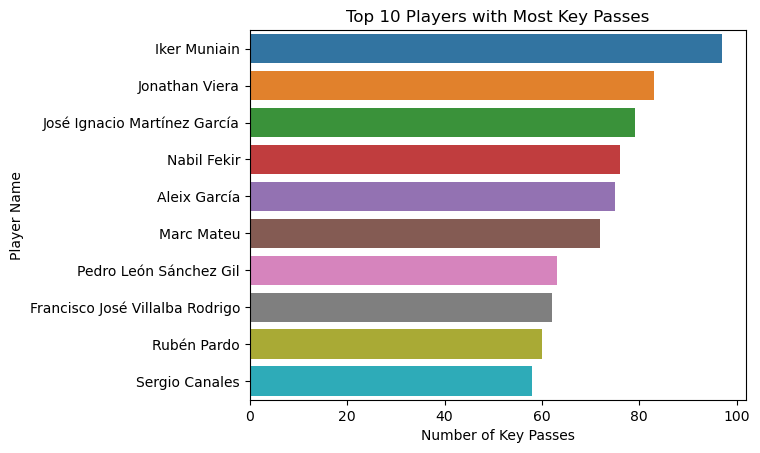

In [25]:
# get top 10 players with most key passes
top_key_passes = df.sort_values(by='key_passes_attempt_assists', ascending=False)[:10]

# create bar plot
sns.barplot(x='key_passes_attempt_assists', y='name', data=top_key_passes)
plt.xlabel('Number of Key Passes')
plt.ylabel('Player Name')
plt.title('Top 10 Players with Most Key Passes')
plt.show()

As we can see that seeing the above graphs there are very similar relationships between successful passes in the opposition half and number of key passes there is less variation between the graph so we can say that hypothesis is correct.

In [26]:
# Calculate correlation coefficient and p-value
corr_coef, p_value = pearsonr(df['successful_passes_opposition_half'], df['key_passes_attempt_assists'])

# Print results
print(f"Correlation coefficient: {corr_coef:.2f}")
print(f"P-value: {p_value:.2f}")

Correlation coefficient: 0.82
P-value: 0.00


The correlation coefficient of 0.82 indicates a strong positive relationship between two variables. It means that as one variable increases, the other variable tends to increase as well.

The p-value of 0.00 indicates that the observed correlation coefficient is statistically significant at a very high level of confidence. Typically, a p-value of less than 0.05 is considered statistically significant, indicating that the observed result is unlikely to have occurred by chance alone.

<AxesSubplot:xlabel='successful_passes_opposition_half', ylabel='key_passes_attempt_assists'>

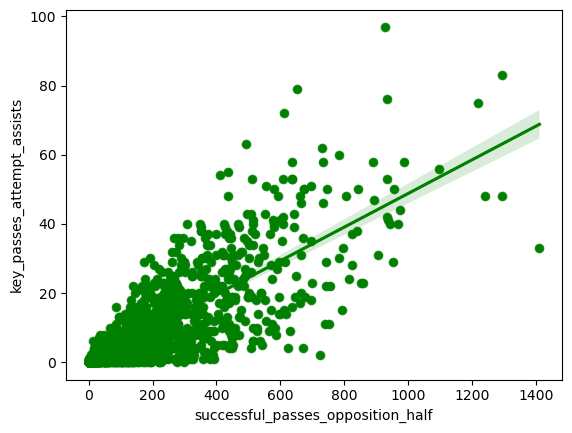

In [27]:
# Create scatter plot
sns.scatterplot(x="successful_passes_opposition_half", y="key_passes_attempt_assists", data=df, color='green')

# Add linear regression line
sns.regplot(x="successful_passes_opposition_half", y="key_passes_attempt_assists", data=df, color='green')

# Hypothesis 3: Players who make more successful tackles have a higher number of interceptions.

Null Hypothesis (H0): There is no significant relationship between the number of successful tackles made by a player and the number of interceptions made by a player.

Alternative Hypothesis (HA): There is a significant relationship between the number of successful tackles made by a player and the number of interceptions made by a player.



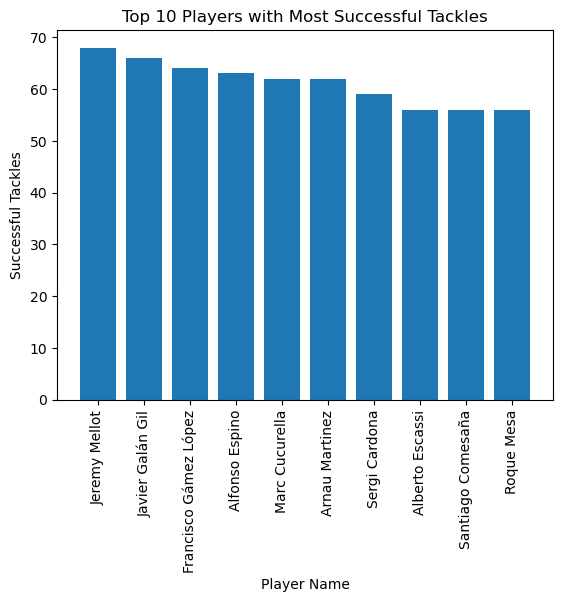

In [28]:
# Sort dataset by successful tackles in descending order
data_sorted = df.sort_values(by="tackles_won", ascending=False)

# Select top 10 players with the most successful tackles
top_10 = data_sorted.head(10)

# Create a bar chart of the top 10 players
plt.bar(x=top_10["name"], height=top_10["tackles_won"])

# Set chart title and axis labels
plt.title("Top 10 Players with Most Successful Tackles")
plt.xlabel("Player Name")
plt.ylabel("Successful Tackles")

# Rotate player names on x-axis to avoid overlapping
plt.xticks(rotation=90)

# Display chart
plt.show()

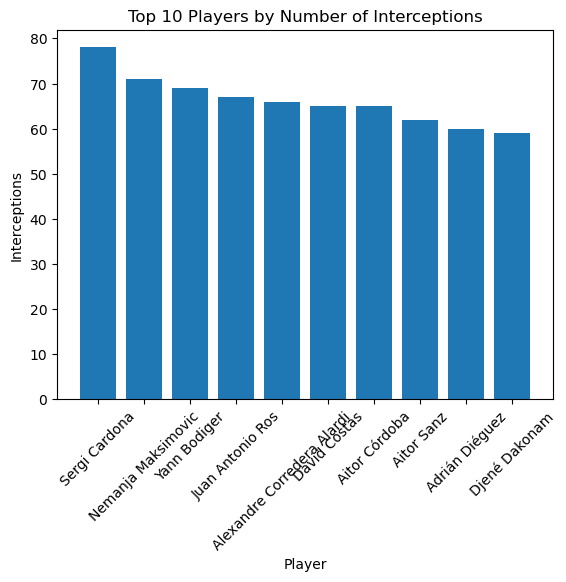

In [29]:
# create a list of top 10 players and their number of interceptions
top_10_players = list(df.sort_values('interceptions', ascending=False)[:10]['name'])
top_10_interceptions = list(df.sort_values('interceptions', ascending=False)[:10]['interceptions'])

# create a bar chart
plt.bar(top_10_players, top_10_interceptions)

# set chart title and labels
plt.title('Top 10 Players by Number of Interceptions')
plt.xlabel('Player')
plt.ylabel('Interceptions')

# rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# display the chart
plt.show()

As we can see that their is little variation in the graphs we can say that it is partially coorelated 

In [30]:
# Set up independent and dependent variables
y = df['interceptions']
X = df['tackles_won']

# Add constant to independent variable
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary statistics
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          interceptions   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.712
Method:                 Least Squares   F-statistic:                     4937.
Date:                Tue, 25 Apr 2023   Prob (F-statistic):               0.00
Time:                        00:53:04   Log-Likelihood:                -6680.3
No. Observations:                1994   AIC:                         1.336e+04
Df Residuals:                    1992   BIC:                         1.338e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.7851      0.186      4.215      

Since the coefficient for the variable "tackles_won" is 0.9644, it can be assumed that a player will make an additional 0.9644 interceptions for every additional successful tackle they make. The association may be statistically significant because the p-value for the variable "tackles_won" is less than 0.05. Therefore, we may rule out the null hypothesis and adopt the alternative hypothesis, which states that there is a substantial correlation between a player's number of successful tackles and interceptions.


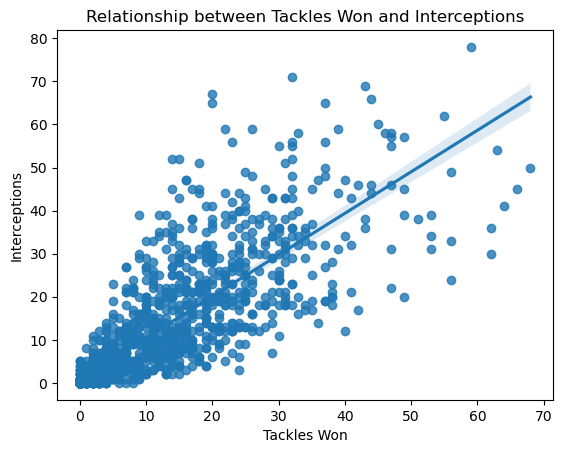

In [31]:
# Plot scatter plot with regression line
sns.regplot(x=df['tackles_won'], y=df['interceptions'])

# Set axis labels and title
plt.xlabel('Tackles Won')
plt.ylabel('Interceptions')
plt.title('Relationship between Tackles Won and Interceptions')

# Show the plot
plt.show()